# Vamos abrir um modelo de IA e olhar o que tem dentro

Estamos interessados em ver os "filtros" (também chamados de kernels) que o modelo usa nas suas camadas de processamento de imagem (camadas convolucionais). Vamos colocar os filtros de uma mesma camada lado a lado para comparar.

Mas primeiro, precisamos pegar um modelo disponível na internet.

Pegaremos a VGG16, num repositório público chamado timm.

In [ ]:
import torch
import timm

# Baixando da internet uma rede neural convolucional
# chamada VGG16
model = timm.create_model('vgg16', pretrained=True)
model.eval()

print("Arquitetura do modelo:\n", model)

# Salvando o modelo localmente
torch.save(model.state_dict(), '/content/model_weights.pth')

Arquitetura do modelo:
 VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=

## Selecionando as camadas convolucionais do modelo de IA

### O que vamos fazer:

Primeiro vamos selecionar apenas as camadas convolucionais do modelo.

Uma rede neural convolucional tem vários outros tipos de camadas que

não nos interessam nesse momento.


In [ ]:
conv_layers = []
for module in model.modules():
    if isinstance(module, torch.nn.Conv2d):
        conv_layers.append(module)


print("Camadas convolucionais identificadas:")
for _layer in conv_layers:
    print(_layer)

Camadas convolucionais identificadas:
Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 4096, kernel_size=(7, 7), stride=(1, 1))
Conv2d(4096, 4096, kernel_size=

## Encontrando as camadas de "filtros"

Para cada camada que encontramos, vamos pegar as informações dos seus "filtros".

**Por que estamos fazendo isso?**

Agora que sabemos quais camadas têm "filtros", vamos extrair os dados de cada um deles para poder visualizá-los depois.


In [ ]:
kernel_weights = []
# Get the indices of the first, second, and last convolutional layers
layer_indices_to_keep = [0, 1, len(conv_layers) - 2]

for layer_idx, conv_layer in enumerate(conv_layers):
    if layer_idx in layer_indices_to_keep:
        kernel_weights.append(conv_layer.weight.data)

print(f"Extraídos os pesos para {len(kernel_weights)} camadas convolucionais.")

Extraídos os pesos para 3 camadas convolucionais.


## Vendo os "filtros"

### O que vamos fazer:

Vamos mostrar os "filtros" que pegamos. Se uma camada tiver muitos filtros, vamos organizá-los lado a lado para facilitar a comparação.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for layer_idx, weights in enumerate(kernel_weights):
    num_kernels = min(weights.shape[0], 64)
    # Determine the number of columns for subplots, aiming for a reasonable layout
    cols = min(num_kernels, 8)
    rows = (num_kernels + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    fig.suptitle(f'Kernels (filtros) da Camada {layer_idx + 1}', fontsize=16)

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    for kernel_idx in range(num_kernels):
        # Select the current kernel
        kernel = weights[kernel_idx]

        # Transpose and rescale for visualization
        # Assuming kernel shape is (out_channels, in_channels, height, width)
        # We need to handle different numbers of input channels
        if kernel.shape[0] == 3: # RGB input
            kernel_display = kernel.permute(1, 2, 0).cpu().numpy()
            kernel_display = (kernel_display - kernel_display.min()) / (kernel_display.max() - kernel_display.min())
        elif kernel.shape[0] == 1: # Grayscale input or single channel
             kernel_display = kernel.squeeze(0).cpu().numpy()
             kernel_display = (kernel_display - kernel_display.min()) / (kernel_display.max() - kernel_display.min())
        else: # Handle other cases, maybe just show the first channel
            kernel_display = kernel[0].cpu().numpy()
            kernel_display = (kernel_display - kernel_display.min()) / (kernel_display.max() - kernel_display.min())


        ax = axes[kernel_idx]
        if kernel_display.ndim == 2:
             ax.imshow(kernel_display, cmap='gray')
        else:
            ax.imshow(kernel_display)

        ax.set_title(f'Kernel {kernel_idx + 1}\nForma: {tuple(kernel.shape)}')
        ax.axis('off')

    # Hide unused subplots
    for i in range(num_kernels, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

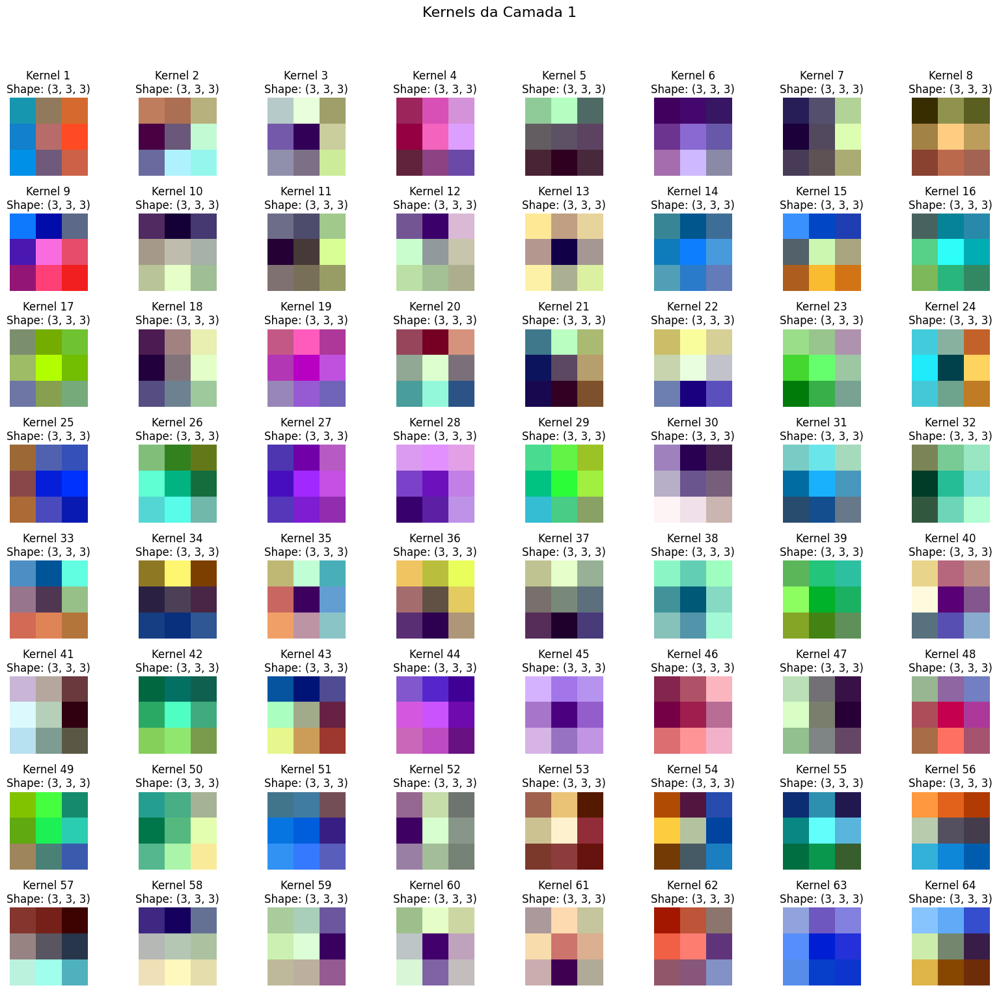

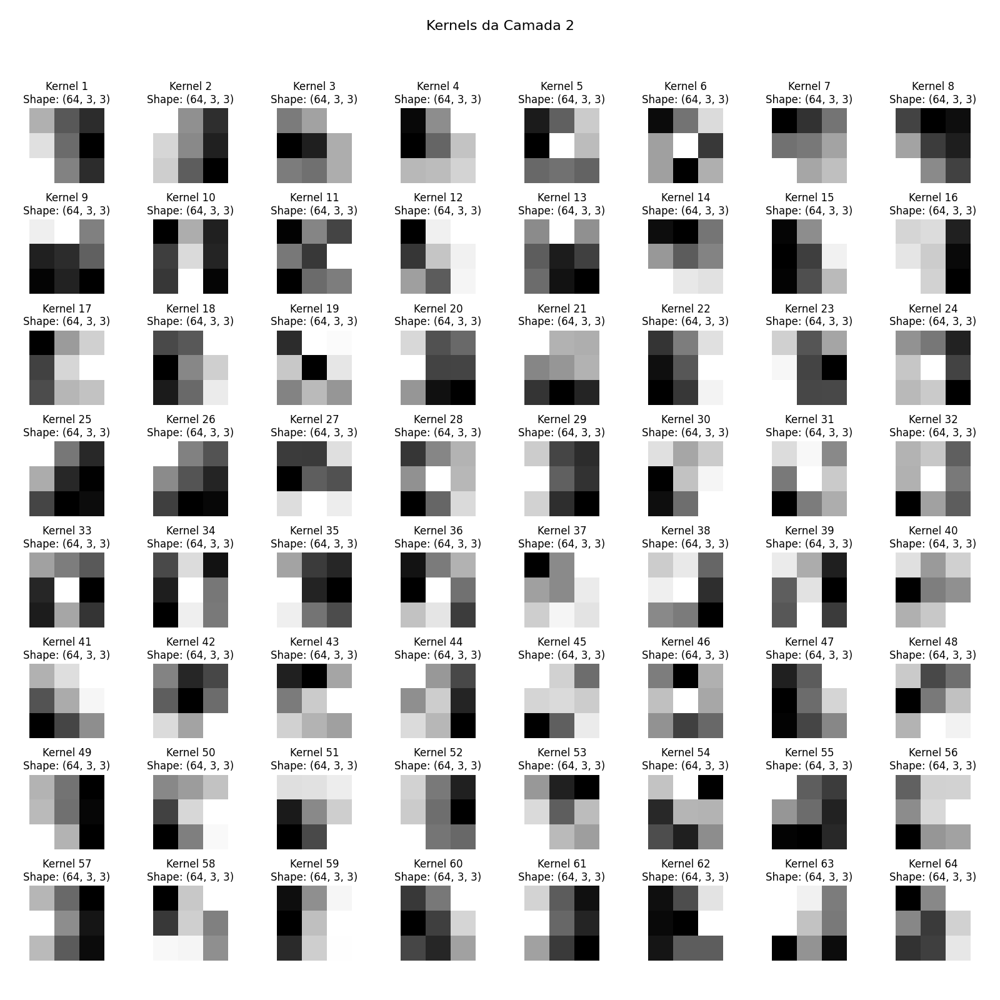

Buffered data was truncated after reaching the output size limit.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import torch
from IPython.display import Image, display as ipy_display
import os

os.makedirs("kernel_gifs", exist_ok=True)

# Simulated example for testing:
# kernel_weights = [torch.randn(32, 3, 5, 5), torch.randn(32, 16, 3, 3)]
# Replace the line above with your actual kernel_weights

for layer_idx, weights in enumerate(kernel_weights):
    num_kernels = min(weights.shape[0], 64)
    cols = min(num_kernels, 8)
    rows = (num_kernels + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = axes.flatten()
    fig.suptitle(f'Kernels da Camada {layer_idx + 1}', fontsize=16)

    animated_kernels = []
    layer_has_animation = False
    has_rgb = False  # To track RGB-only layers

    for kernel_idx in range(num_kernels):
        kernel = weights[kernel_idx]  # (in_channels, H, W)
        ax = axes[kernel_idx]

        if kernel.shape[0] == 3:
            has_rgb = True
            rgb = kernel.detach().cpu().permute(1, 2, 0).numpy()
            rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-6)
            rgb = np.clip(rgb, 0, 1)
            ax.imshow(rgb)
        else:
            layer_has_animation = True
            imgs = []
            for c in range(kernel.shape[0]):
                img = kernel[c].detach().cpu().numpy()
                img = (img - img.min()) / (img.max() - img.min() + 1e-6)
                imgs.append(img)

            im = ax.imshow(imgs[0], cmap='gray', animated=True)
            animated_kernels.append((im, imgs))

        ax.set_title(f'Kernel {kernel_idx + 1}\nShape: {tuple(kernel.shape)}')
        ax.axis('off')

    for i in range(num_kernels, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    if layer_has_animation:
        def update(frame):
            for im, imgs in animated_kernels:
                im.set_array(imgs[frame % len(imgs)])
            return [im for im, _ in animated_kernels]

        max_frames = max(len(imgs) for _, imgs in animated_kernels)
        ani = animation.FuncAnimation(fig, update, frames=max_frames, interval=500, blit=False)

        gif_path = f'kernel_gifs/layer_{layer_idx + 1}.gif'

        try:
            ani.save(gif_path, writer='pillow', fps=3)
        except Exception as e:
            print(f"Failed to save animation for layer {layer_idx + 1}: {e}")

        ipy_display(Image(gif_path))
        #plt.close("all")


    elif has_rgb:
        # RGB-only layer — display and save
        png_path = f'kernel_gifs/layer_{layer_idx + 1}.png'
        plt.savefig(png_path, bbox_inches='tight')
        ipy_display(Image(png_path))
        plt.close(fig)

    else:
        plt.close(fig)


## Resumo:

### O que descobrimos:

* Conseguimos encontrar e mostrar os "filtros" (kernels) que o modelo usa para processar as imagens.
* Só mostramos os filtros que tinham um tamanho de 3x3 pixels ou maiores.
* Colocamos os filtros da mesma camada um ao lado do outro para que pudessem ser comparados.
* Conseguimos ver os filtros mesmo quando eles trabalhavam com diferentes tipos de imagens (com 1 ou 3 cores, por exemplo).
